# Data Preparation

In [1]:
import requests
import pandas as pd
from datetime import datetime
import csv
from matplotlib import pyplot as plt
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
from nltk.corpus import stopwords
import string
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
import nltk
import re
from spellchecker import SpellChecker
import spacy

## Data Acquisition and Understanding

### Goal:
Basically, the project is to segment the most similar subreddit to a user based on the similarity of the post that user is interacting with (may including upvotes and comments). Analyse and understand the data, perform EDA to ensure data collected is reliable for effective decision making.

In [2]:
pd.set_option("display.max_columns", None)
submission_df = pd.read_csv('submissions.csv')
submission_df.head()

,id,kind,category,created_utc,author,name,subreddit_id,subreddit_subscriber,subreddit,title,selftext,upvote_ratio,url,num_comments,ups,downs,total_awards_received,score,created,num_crossposts
0,slzdzs,t3,NaN,1.644162e+09,Independent_Bee_4468,t3_slzdzs,t5_2qs0k,51514,Home,What is this mud-like lump that recently appea...,NaN,0.50,https://www.reddit.com/gallery/slzdzs,28,0,0,0,0,1.644162e+09,0
1,qrti73,t3,NaN,1.636660e+09,TopSpite9394,t3_qrti73,t5_2qs0k,51514,Home,Any idea what this is? Sorry if this is a dumb...,NaN,0.60,https://www.reddit.com/gallery/qrti73,24,15,0,0,15,1.636660e+09,0
2,p1se4g,t3,NaN,1.628612e+09,villanegg,t3_p1se4g,t5_2qs0k,51514,Home,I just bought my first flat. First pic!,NaN,0.53,https://i.redd.it/ygtww9pv1kg71.jpg,6,1,0,0,1,1.628612e+09,0
3,oeiaps,t3,NaN,1.625525e+09,Cristheideaman,t3_oeiaps,t5_2qs0k,51514,Home,Exterior project my family completed follow on...,NaN,0.50,https://v.redd.it/sd1smhg84h971,0,0,0,0,0,1.625525e+09,0
4,nadi4r,t3,NaN,1.620784e+09,Nahughes121989,t3_nadi4r,t5_2qs0k,51514,Home,Loving my new living room setup. Just need a p...,NaN,0.59,https://i.redd.it/gt880tx8hly61.jpg,11,6,0,0,6,1.620784e+09,0


In [3]:
submission_df = submission_df.dropna(subset=['title'])
submission_df['selftext'].fillna(" ", inplace=True)
submission_df['transcript'] = submission_df['title'] + submission_df['selftext'] 
group_submission = submission_df[['subreddit', 'transcript']].groupby('subreddit')
submission_corpus = group_submission['transcript'].apply(lambda txt: " ".join(txt)).reset_index()
submission_corpus.head()

,subreddit,transcript
0,2007scape,I was trying to record this potential scammer ...
1,3Dprinting,Official Response from Cults regarding the u/B...
2,AmItheAsshole,AITA for having my 18 year old daughter pay fo...
3,AskMen,What is your experience with quiet girls?I (32...
4,AskReddit,Would you refrain from masturbation or sex for...


In [4]:
comments_df = pd.read_csv('comments_.csv')
comments_df.head()

,author,body,created_utc,id,parent_id,subreddit,subreddit_id,score
0,LT-COL-Obvious,"Don’t shoot a BB gun at it, you’ll shoot your ...",1642012439,hsdpqpx,t3_s29o71,Home,t5_2qs0k,1
1,turkeyburpin,"1. Others are correct, check into your insulat...",1642011979,hsdohyq,t3_s29o71,Home,t5_2qs0k,1
2,c0ncept,These ripped an entire gutter off my old house...,1642011771,hsdnxhb,t3_s29o71,Home,t5_2qs0k,1
3,Jared944,Glue. Lots of glue. Glue it tight; glue it right.,1642011753,hsdnvrn,t3_s1uyss,Home,t5_2qs0k,1
4,PirateINDUSTRY,Nothing like doing sub-zero roofing work on yo...,1642010983,hsdlsv2,t1_hsdcpvs,Home,t5_2qs0k,1


In [5]:
comments_df = comments_df.dropna(subset=['body'])
group_comments = comments_df[['subreddit', 'body']].groupby('subreddit')
comment_corpus = group_comments['body'].apply(lambda txt: " ".join(txt)).reset_index()
comment_corpus.head()

,subreddit,body
0,2007scape,Nice This is basically FFXIV Luv u Boobie Bras...
1,3Dprinting,1. My bed is leveled properly i think. \n2. As...
2,AmItheAsshole,"NTA. You need to drop that girl ASAP, you just..."
3,AskMen,Everyone is a mess in highschool. At least you...
4,AskReddit,"Honestly, at that age, go out, make mistakes. ..."


## Exploratory Data Analysis (EDA) 
The purpose here is to figure out the trends in the reddit corpus by summarizing the main features using various visualization techniques. Analyzing the data by generating simple statistics and making sense of it. 
- Does the most frequent words tell us anything relating to subreddit context?
- Vocabulary

#### Merge both submission and comment transcript by subreddit
For EDA purpose, all transcript of comments and submissions are group by subreddit to ease the data visualization. In contrast, during modeling, we're going to ignore the fact that these transcripts belong to the same subreddit, the main objectives of topic modeling is to reveal hidden topics in the transcript as a whole. Thus, each comment/submission will be input as a document during the preprocessing and topic modeling process.

In [6]:
corpus = submission_corpus.merge(comment_corpus, on ="subreddit")
corpus.head()

,subreddit,transcript,body
0,2007scape,I was trying to record this potential scammer ...,Nice This is basically FFXIV Luv u Boobie Bras...
1,3Dprinting,Official Response from Cults regarding the u/B...,1. My bed is leveled properly i think. \n2. As...
2,AmItheAsshole,AITA for having my 18 year old daughter pay fo...,"NTA. You need to drop that girl ASAP, you just..."
3,AskMen,What is your experience with quiet girls?I (32...,Everyone is a mess in highschool. At least you...
4,AskReddit,Would you refrain from masturbation or sex for...,"Honestly, at that age, go out, make mistakes. ..."


In [7]:
corpus['full_transcript'] = corpus['transcript'] + " " + corpus['body']
corpus.drop(['transcript', 'body'], axis=1, inplace=True)
corpus.head()

,subreddit,full_transcript
0,2007scape,I was trying to record this potential scammer ...
1,3Dprinting,Official Response from Cults regarding the u/B...
2,AmItheAsshole,AITA for having my 18 year old daughter pay fo...
3,AskMen,What is your experience with quiet girls?I (32...
4,AskReddit,Would you refrain from masturbation or sex for...


### Most Frequent Words

#### Top 50 words in whole transcript

In [8]:
from collections import Counter

cnt = Counter()
for text in corpus['full_transcript'].values:
    for word in text.split():
        cnt[word] += 1

common_df = pd.DataFrame()
common_df["word"] = [w for (w, wc) in cnt.most_common(50)]
common_df["frequency"] = [wc for (w, wc) in cnt.most_common(50)]
common_df.head()

,word,frequency
0,the,130768
1,to,102421
2,and,89198
3,a,84202
4,I,78758


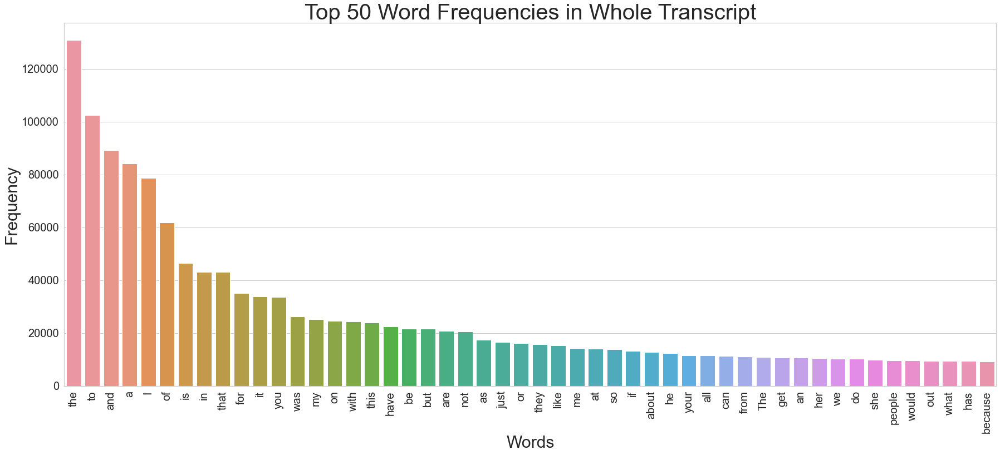

In [9]:
import seaborn as sns

plt.rcParams['figure.figsize'] = [30, 12]
sns.set_theme(style="whitegrid")
bp = sns.barplot(x="word", y="frequency", data=common_df)
bp.axes.set_title("Top 50 Word Frequencies in Whole Transcript",fontsize=40)
bp.set_xlabel("Words",fontsize=30)
bp.set_ylabel("Frequency",fontsize=30)
bp.tick_params(labelsize=20, axis='x', rotation=90)
bp.tick_params(labelsize=20, axis='y')
plt.show()

### Insights:
Well, by visualizing the bar chart of top 50 most frequent words, we couldn't reveal any important insights within the corpus as these words doesn't tell us much about any of the subreddit themes. These words such as <b>'the', 'to', 'and', 'a' etc.</b> belong to stopwords which commonly used in every subreddit and should be strip out in the preprocessing step.

#### Document Term Matrix

In [10]:
from sklearn.feature_extraction import text

stop_words = text.ENGLISH_STOP_WORDS
cvn = CountVectorizer(stop_words=stop_words)
data_cvn = cvn.fit_transform(corpus.full_transcript)
data_dtmm = pd.DataFrame(data_cvn.toarray(), columns=cvn.get_feature_names())
data_dtmm.index = corpus.subreddit
data_dtmm = data_dtmm.transpose()
data_dtmm.head()

subreddit,2007scape,3Dprinting,AmItheAsshole,AskMen,AskReddit,BestofRedditorUpdates,CasualUK,Cringetopia,CryptoCurrency,Damnthatsinteresting,DnD,EscapefromTarkov,Games,Genshin_Impact,GlobalOffensive,HolUp,Home,IdiotsInCars,Jokes,LivestreamFail,MadeMeSmile,MaliciousCompliance,MechanicalKeyboards,Minecraft,Music,NoStupidQuestions,OnePiece,Piracy,ProgrammerHumor,PublicFreakout,StarWars,Superstonk,ThatsInsane,Tinder,TooAfraidToAsk,TrueOffMyChest,Twitch,TwoXChromosomes,Unexpected,VALORANT,WTF,Wellthatsucks,WhitePeopleTwitter,anime,antiwork,apexlegends,aww,buildapc,discordapp,dndnext,dyinglight,euphoria,europe,explainlikeimfive,facepalm,ffxiv,formula1,funny,gaming,gifs,greentext,halo,instant_regret,interestingasfuck,leagueoflegends,lostarkgame,manga,memes,mildlyinfuriating,movies,nba,news,nextfuckinglevel,nfl,nottheonion,oddlyterrifying,olympics,ontario,pathofexile,pcgaming,pcmasterrace,personalfinance,pics,pokemon,politics,relationship_advice,science,soccer,sysadmin,technology,teenagers,television,therewasanattempt,tifu,todayilearned,unpopularopinion,videos,wallstreetbets,worldnews,wow
00,0,0,2,2,0,10,0,0,7,0,1,4,0,0,0,2,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,14,2,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,2,2,0,1,0,2,0,0,0,6,0,0,0,0,6,2,0,22,0,2,4,0,0,6,0,0,0,0,0,4,0,0,1,5,0,0
000,5,5,2,0,8,9,2,2,26,8,2,13,3,8,0,2,0,1,15,2,0,26,0,0,0,4,0,0,0,2,0,8,3,1,7,8,2,10,1,6,3,0,2,0,2,2,0,11,10,1,0,0,17,10,5,5,1,0,1,0,0,2,1,4,1,2,0,0,0,0,0,4,2,28,12,0,0,12,6,2,1,121,0,4,7,2,8,2,3,9,4,2,2,2,1,14,9,75,13,5
0000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0
000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0000000000004,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


#### Word Cloud for all subreddits

In [11]:
from wordcloud import WordCloud

wc = WordCloud(stopwords=stop_words, background_color='white', colormap="Dark2", max_font_size=150, random_state=42)

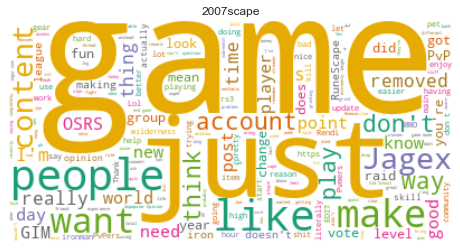

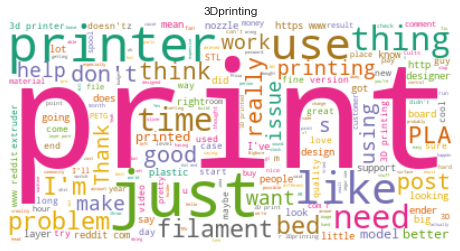

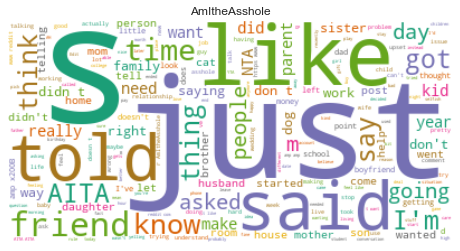

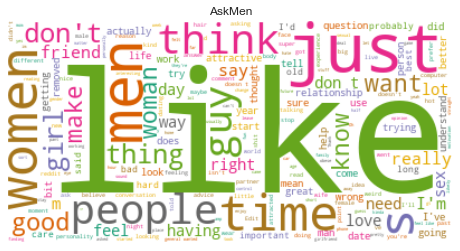

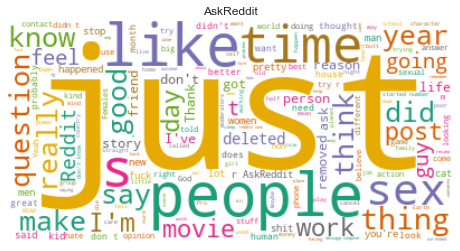

...

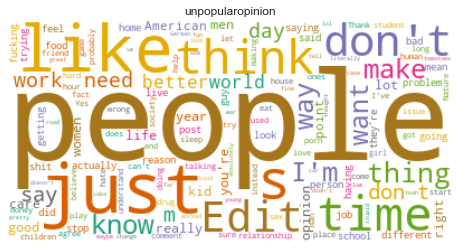

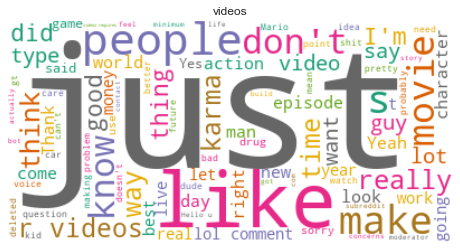

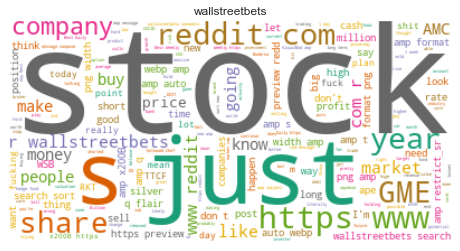

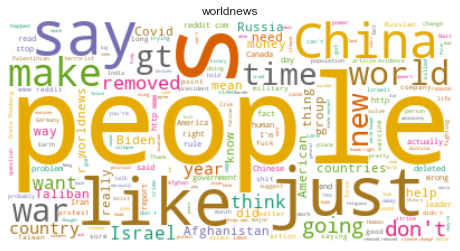

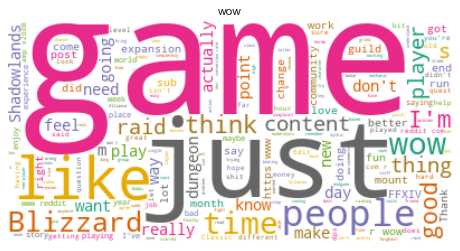

In [12]:
import matplotlib.pyplot as plt

# plt.rcParams['figure.figsize'] = [30, 12]

full_names = [subreddit for subreddit in data_dtmm.columns]

# Create subplots for each comedian
for index, subreddit in enumerate(data_dtmm.columns):
    wc.generate(corpus.at[submission_corpus['subreddit'].eq(subreddit).idxmax(), 'full_transcript'])
    plt.figure(figsize=(8,8))
#     plt.subplot(10, 10, index+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(full_names[index])
    plt.show()

### Insights:
However, we can observe from the word clouds that some of the choice of words that were favoured by different subreddits. Most obvious examples is subreddits like <b>2007scape, Genshin_impact, GlobalOffensive, Games, EscapefromTarkov, dyinglight, VALORANT, pokemon, pcgaming</b> etc. favours word like <b>'game'</b> which seem to resonate with themes that the subreddit was discussing about. 

Another thing to notice is there are still handful of words that seem to be quite out of place in some subreddits such as <b>'make', 'S', 'just', 'like' etc.</b> which seem to appear commonly all over the corpus. Subreddit like <b>'therewasanattempt'</b> doesn't show any obvious frequent words and many words are equally spread within the subreddit. We can also notice that there exist <b>urls ('www', 'http', 'com')</b> that is commonly used over the subreddits.

## Vocabulary

In [13]:
unique_list = []
for subreddit in data_dtmm.columns:
    uniques = data_dtmm[subreddit].to_numpy().nonzero()[0].size
    unique_list.append(uniques)

data_words = pd.DataFrame(list(zip(full_names, unique_list)), columns=['subreddit', 'unique_words'])
data_unique_sort = data_words.sort_values(by="unique_words", ascending=False)
data_unique_sort.head()

,subreddit,unique_words
5,BestofRedditorUpdates,12023
49,dndnext,6923
21,MaliciousCompliance,6661
93,tifu,6112
10,DnD,5715


#### Vocabulary Chart

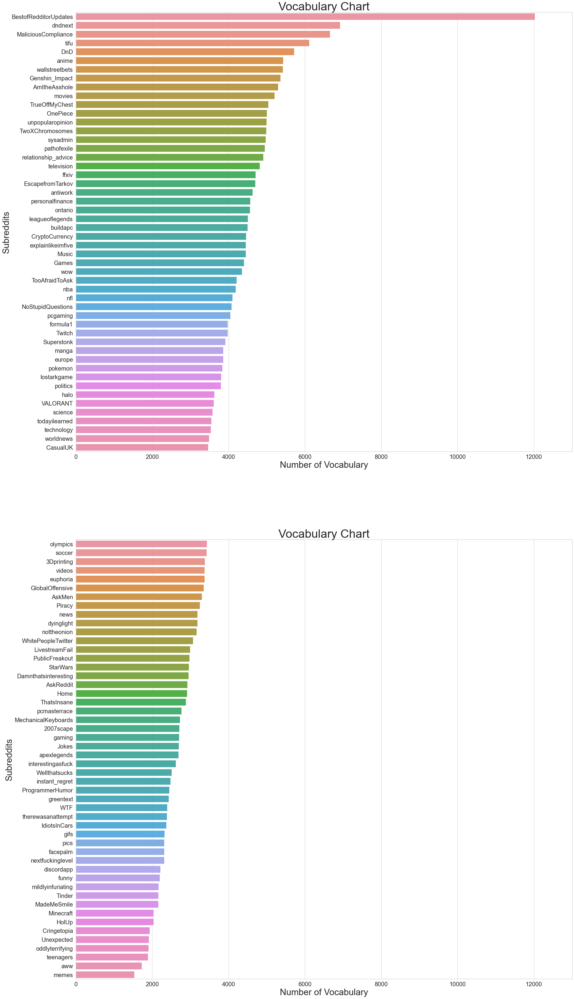

In [14]:
sns.set_theme(style="whitegrid")

# Initialize the matplotlib figure
f, ax = plt.subplots(2, 1, figsize=(30,60))
ax = ax.flatten()

unique_1 = data_unique_sort.iloc[:50]
unique_2 = data_unique_sort.iloc[50:]


sns.set_color_codes("muted")

bp = sns.barplot(x="unique_words", y="subreddit", data=unique_1, label="Vocabulary", ax=ax[0])
bp.axes.set_title("Vocabulary Chart", fontsize=40)
bp.set_xlabel("Number of Vocabulary", fontsize=30)
bp.set_ylabel("Subreddits", fontsize=30)
bp.set(xlim=(0, 13000))
bp.tick_params(labelsize=20)

bp = sns.barplot(x="unique_words", y="subreddit", data=unique_2, label="Vocabulary", ax=ax[1])
bp.axes.set_title("Vocabulary Chart", fontsize=40)
bp.set_xlabel("Number of Vocabulary", fontsize=30)
bp.set_ylabel("Subreddits", fontsize=30)
bp.set(xlim=(0, 13000))
bp.tick_params(labelsize=20)

### Insights:
Clearly, memes and aww subreddits have the least vocabulary.

Notice anything odd about the chart that the <b>BestofRedditorUpdates</b> have a much larger vocabulary<b>(around 50% differences of unique words)</b> compare to <b>dndnext</b> which appear to be the second largest vocabulary subreddit. Based on the title and content of the subreddit, there are chances that <b>BestofRedditorUpdates</b> revolve around huge range from a scope of many different themes. So something to think about, should we consider to remove these unique words? Due to the fact they rarely offer anything interesting causing the association between them and other words to be dominated by noise.

#### BestofRedditorUpdates's Unique Words

In [15]:
res = Counter()
BRU = corpus[corpus.subreddit == "BestofRedditorUpdates"]
BRU['full_transcript'].apply(lambda x: res.update(x.split()))
sorted(res.items(), key=lambda pair: pair[1])[:50]

[('2**DISCLAIMER-**', 1),
 ('[u/hell\\_hath\\_no\\_fury__](https://www.reddit.com/u/hell_hath_no_fury__/)',
  1),
 ('Fight', 1),
 ('Insight**', 1),
 ('behalf.', 1),
 ('**we**', 1),
 ('**he**', 1),
 ('cheated..', 1),
 ('bullshit?', 1),
 ('great;', 1),
 ('responsibilities.', 1),
 ('(work,', 1),
 ('upkeep)', 1),
 ('appealing.', 1),
 ('plumbers,', 1),
 ('Probably,', 1),
 ('function,', 1),
 ('appointments,', 1),
 ('clothing,', 1),
 ('coupons,', 1),
 ('tended', 1),
 ('baths,', 1),
 ('short;', 1),
 ('nonexistent.', 1),
 ('would)', 1),
 ('relaxed.', 1),
 ('stressed,', 1),
 ('day...', 1),
 ('suspected;', 1),
 ('daily?', 1),
 ('first?', 1),
 ('bills?', 1),
 ('fantasy', 1),
 ('tough,', 1),
 ('advance.', 1),
 ('revolving', 1),
 ('him/them?', 1),
 ('slack', 1),
 ('ages.', 1),
 ('reward?', 1),
 ("'better'", 1),
 ('leaves/cheats.', 1),
 ('myself?', 1),
 ('Meltdown**', 1),
 ('correction,', 1),
 ('relief...or', 1),
 ('added.', 1),
 ('follows:', 1),
 ('*"New', 1),
 ('Partners:', 1)]

### Insights:
To realize the factor of the differences, we dive into the unique words in <b>BestofRedditorUpdates</b>, and most of the results are due to the presence of string special characters and different variations of similar words. This clearly tell us the importance of a good text pipeline before performing any vital Natural Language Processing tasks.

<br><br>

***